<a href="https://colab.research.google.com/github/FarrelAD/Penglihatan-Komputer/blob/main/notebooks/week-3.ipynb" target="_blank">
    <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Preparation

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd

# 1st Practicum - Simple Image Operations

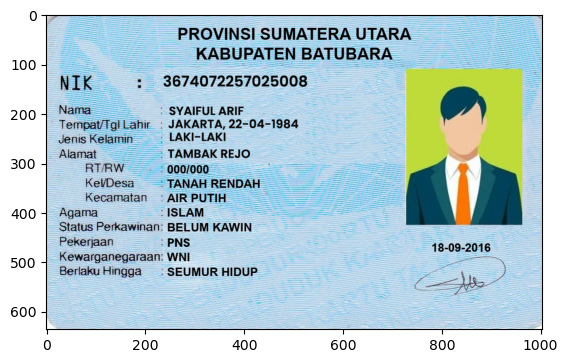

In [2]:
img = cv2.imread('../assets/ktp-dummy.png')

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

## 1. Implementation of inverse on an image

- Using NumPy operation

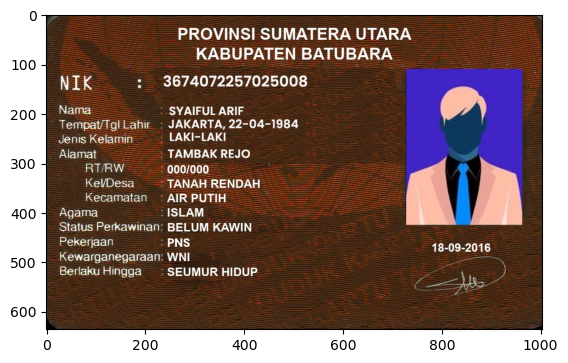

In [3]:
img_1 = img.copy() # type: ignore

inverted_img = 255 - img_1
inverted_img_rgb = cv2.cvtColor(inverted_img, cv2.COLOR_BGR2RGB)

plt.imshow(inverted_img_rgb)

- Using OpenCV built in function

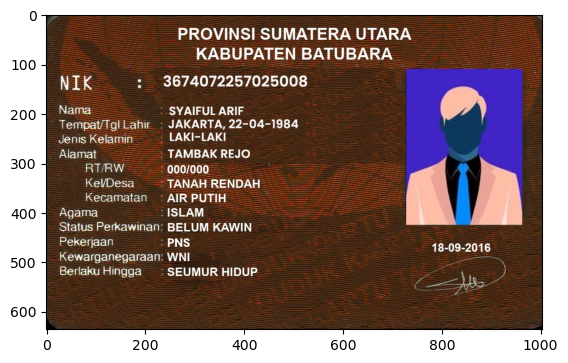

In [4]:
img_2 = img.copy() # type: ignore

inverted_img = cv2.bitwise_not(img_2)
inverted_img_rgb = cv2.cvtColor(inverted_img, cv2.COLOR_BGR2RGB)

plt.imshow(inverted_img_rgb)

## 2. Implementation of contrast transformations

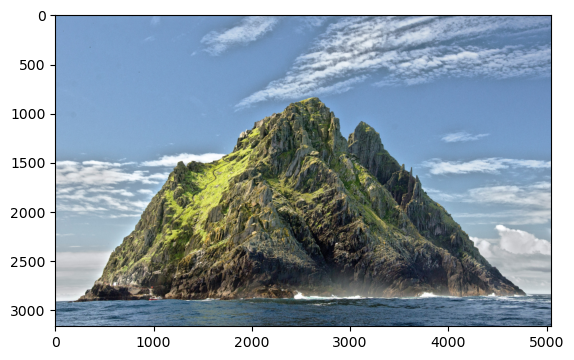

In [5]:
img = cv2.imread('../assets/skellig-michael.jpg')

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

- Using OpenCV

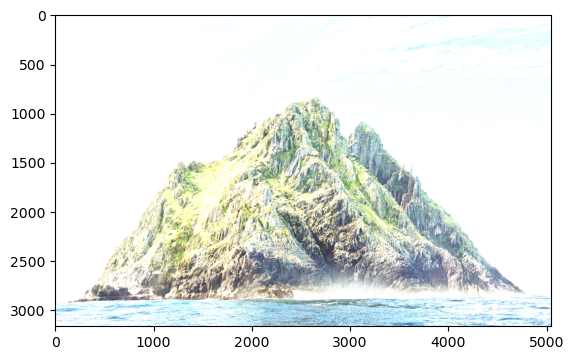

In [6]:
img_2a = cv2.convertScaleAbs(
    img,                    # type: ignore
    alpha=2.0,              # alpha for contrast
    beta=50                 # beta for brightness
)

img_2a_rgb = cv2.cvtColor(img_2a, cv2.COLOR_BGR2RGB)

plt.imshow(img_2a_rgb)

- From scratch

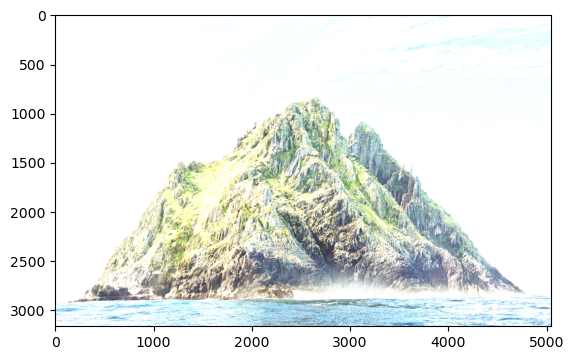

In [7]:
def transformContrastBrightness(
    img: np.ndarray,
    alpha: float = 1.0,
    beta: float = 0.0
) -> np.ndarray:
    """
    Formula:
        g(x, y) = alpha * f(x, y) + beta
    
    Args:
        img (np.ndarray): Input image (grayscale or color, dtype=uint8).
        alpha (float): Contrast factor. 
                       1.0 = no change, >1.0 = higher contrast, 0–1.0 = lower contrast.
        beta (float): Brightness offset. 
                      0 = no change, >0 = brighter, <0 = darker.

    Returns:
        np.ndarray: Adjusted image, dtype=uint8, same shape as input.
    """
    adjusted = alpha * img.astype(np.float32) + beta

    return np.clip(adjusted, 0, 255).astype(np.uint8)

img_2b = transformContrastBrightness(
    img,                    # type: ignore
    alpha=2.0,              # alpha for contrast
    beta=50                 # beta for brightness
)

img_2b_rgb = cv2.cvtColor(img_2b, cv2.COLOR_BGR2RGB)

plt.imshow(img_2b_rgb)

## 3. Implementation of logarithmic brightness transformation

- From scratch

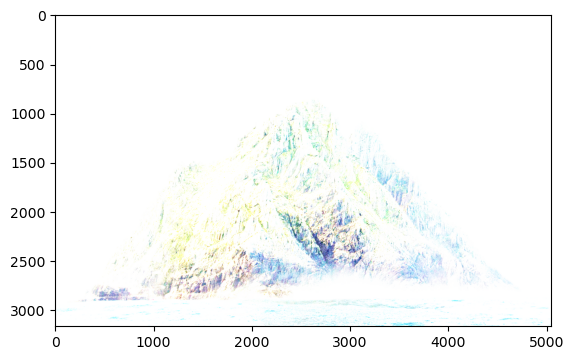

In [8]:
def log_brightness_transform(
    img: np.ndarray,
    value: int = 0
) -> np.ndarray:
    """
    Apply logarithmic brightness transformation.

    Formula:
        g(x, y) = c * log(1 + f(x, y))

    Args:
        img (np.ndarray): Input grayscale or color image (dtype=uint8).
        value (int): Brightness value scale (-100 to +100)

    Returns:
        np.ndarray: Log-transformed image (dtype=uint8).
    """
    value = max(-100, min(100, value))

    # Map [-100, 100] → [0.0, 2.0]
    scale = 1 + (value / 100)
    
    img_float = img.astype(np.float32)
    c = 255 / np.log(1 + np.max(img_float))
    log_transformed = scale * c * np.log(1 + img_float)

    return np.clip(log_transformed, 0, 255).astype(np.uint8)

img_3a = log_brightness_transform(img, value=50) # type: ignore
img_3a_rgb = cv2.cvtColor(img_3a, cv2.COLOR_BGR2RGB)
plt.imshow(img_3a_rgb)

Brightness: 0


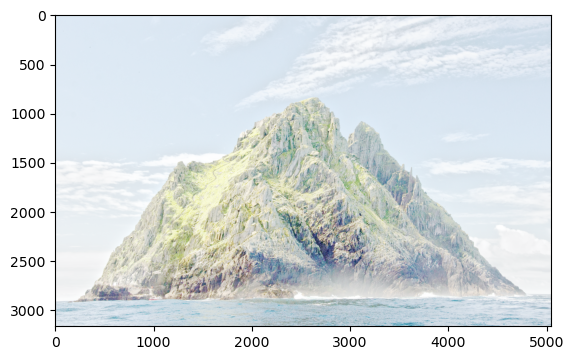

Brightness: 10


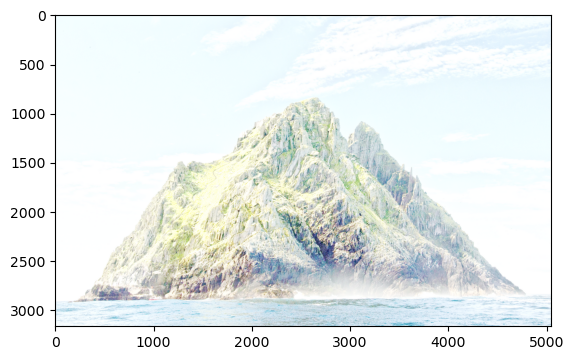

Brightness: 20


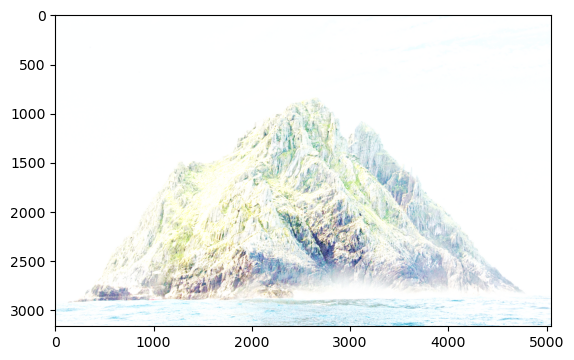

Brightness: 30


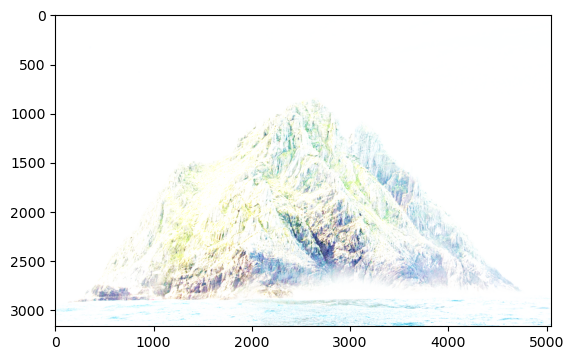

Brightness: 40


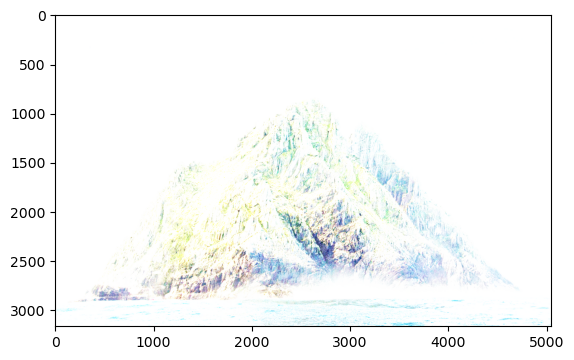

Brightness: 50


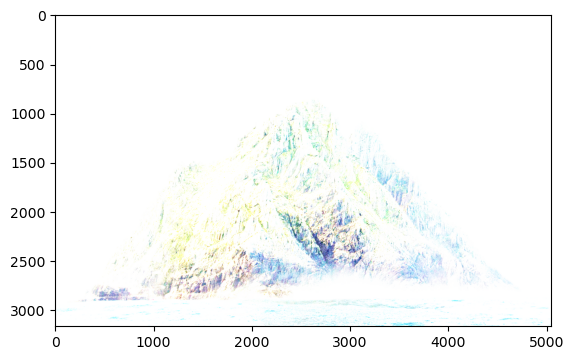

Brightness: 60


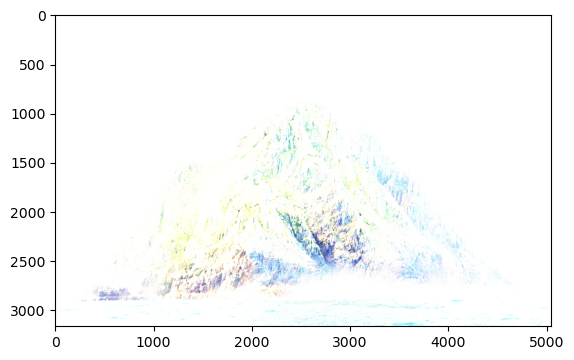

Brightness: 70


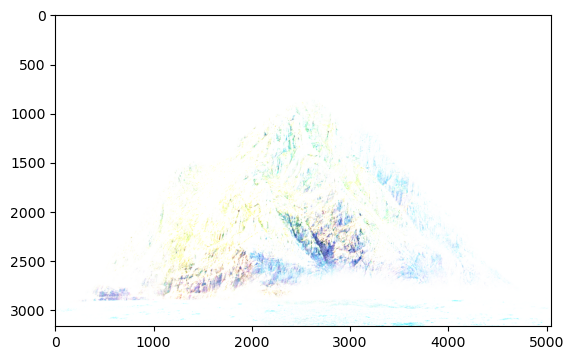

Brightness: 80


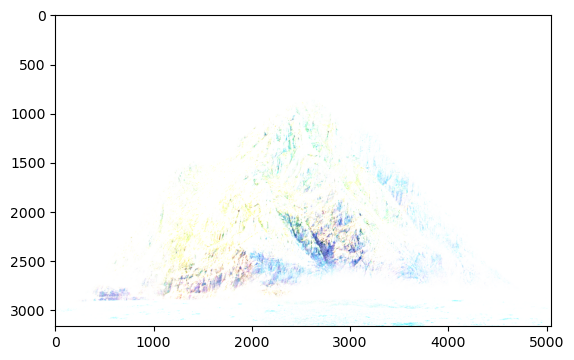

Brightness: 90


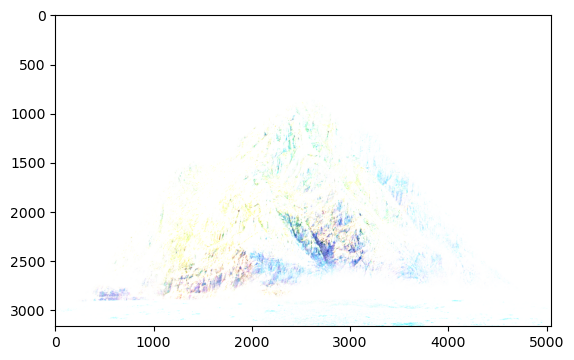

In [9]:
for i in range(10):
    brightness = i * 10
    print(f'Brightness: {brightness}')
    img_i = log_brightness_transform(img, value=brightness) # type: ignore
    img_i_rgb = cv2.cvtColor(img_i, cv2.COLOR_BGR2RGB)
    plt.imshow(img_i_rgb)
    plt.show()

## 4. Implementation of grayscale transformation using averaging, lightness, and luminance methods

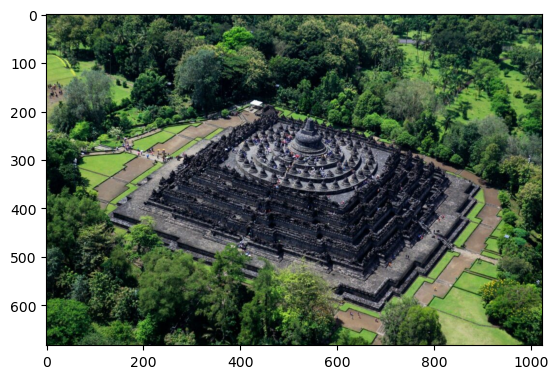

In [10]:
img = cv2.imread('../assets/candi-borobudur.jpg')

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

Helper functions to do grayscaling. These functions are better not used for images with large resolution. It’s better to use vectorization for fast computation.

In [11]:
def grayscale_avg(blue: int, green: int, red: int) -> int:
    """
    Convert a BGR color to grayscale using the average method.

    This method computes the grayscale value by taking the average of
    the blue, green, and red components.

    Formula:
        gray = round((B + G + R) / 3)

    Args:
        blue (int): Blue channel value (0-255).
        green (int): Green channel value (0-255).
        red (int): Red channel value (0-255).

    Returns:
        int: Grayscale value (0-255).
    """
    return round((blue + green + red) / 3)


def grayscale_lightness(blue: int, green: int, red: int) -> int:
    """
    Convert a BGR color to grayscale using the lightness method.

    This method computes the grayscale value by averaging the maximum
    and minimum among the blue, green, and red components. It tends to
    better preserve contrasts than the simple average method.

    Formula:
        gray = round((max(B, G, R) + min(B, G, R)) / 2)

    Args:
        blue (int): Blue channel value (0-255).
        green (int): Green channel value (0-255).
        red (int): Red channel value (0-255).

    Returns:
        int: Grayscale value (0-255).
    """
    bgr_tuple = (blue, green, red)
    return round((max(bgr_tuple) + min(bgr_tuple)) / 2)


def grayscale_luminance(blue: int, green: int, red: int) -> int:
    """
    Convert a BGR color to grayscale using the luminance method.

    This method computes the grayscale value by applying a weighted sum
    to the blue, green, and red components, reflecting human visual
    sensitivity (the human eye is more sensitive to green, less to blue).

    Formula:
        gray = round(0.07 * B + 0.72 * G + 0.21 * R)

    Args:
        blue (int): Blue channel value (0-255).
        green (int): Green channel value (0-255).
        red (int): Red channel value (0-255).

    Returns:
        int: Grayscale value (0-255).
    """
    return round(
        0.07 * blue +
        0.72 * green +
        0.21 * red
    )

Another helper functions that optimized with NumPy vectorization to accelerate computation.

In [12]:
def vectorized_gray_avg(img: np.ndarray) -> np.ndarray:
    """
    Convert a BGR image to grayscale using the average method.

    This method computes the grayscale value by averaging the
    three channels (blue, green, red).

    Formula:
        gray = round((B + G + R) / 3)

    Args:
        img (np.ndarray): Input color image in BGR format
                         (as loaded by OpenCV).

    Returns:
        np.ndarray: Grayscale image (dtype=uint8).
    """
    return img.mean(axis=2).round().astype(np.uint8)


def vectorized_gray_lightness(img: np.ndarray) -> np.ndarray:
    """
    Convert a BGR image to grayscale using the lightness method.

    This method computes the grayscale value as the average of
    the maximum and minimum channel values.

    Formula:
        gray = round((max(B, G, R) + min(B, G, R)) / 2)

    Args:
        img (np.ndarray): Input color image in BGR format
                         (as loaded by OpenCV).

    Returns:
        np.ndarray: Grayscale image (dtype=uint8).
    """
    return ((img.max(axis=2) + img.min(axis=2)) / 2).round().astype(np.uint8)

def vectorized_gray_luminance(img: np.ndarray) -> np.ndarray:
    """
    Convert a BGR image to grayscale using the luminance method.

    This method computes the grayscale value as a weighted sum
    of the channels, reflecting human visual perception.
    Since OpenCV images are in BGR order, the weights are applied as:

    Formula:
        gray = round(0.07 * B + 0.72 * G + 0.21 * R)

    Args:
        img (np.ndarray): Input color image in BGR format
                         (as loaded by OpenCV).

    Returns:
        np.ndarray: Grayscale image (dtype=uint8).
    """
    return (
        0.07 * img[..., 0] +  # Blue
        0.72 * img[..., 1] +  # Green
        0.21 * img[..., 2]    # Red
    ).round().astype(np.uint8)

Non-vectorized method

C:\Users\KarlSchmidt\AppData\Local\Temp\ipykernel_8864\3308313393.py:19: RuntimeWarning: overflow encountered in scalar add
  return round((blue + green + red) / 3)
C:\Users\KarlSchmidt\AppData\Local\Temp\ipykernel_8864\3308313393.py:42: RuntimeWarning: overflow encountered in scalar add
  return round((max(bgr_tuple) + min(bgr_tuple)) / 2)


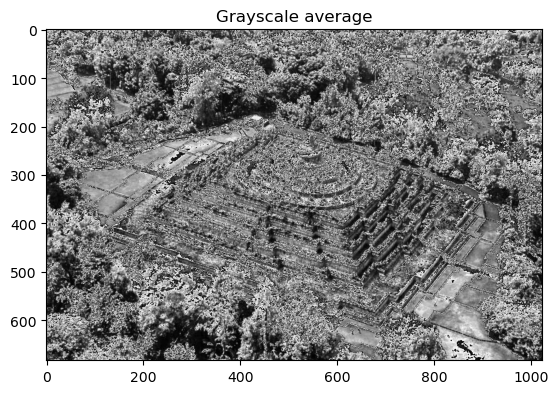

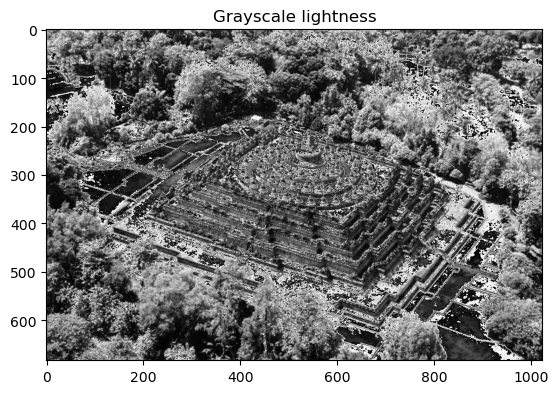

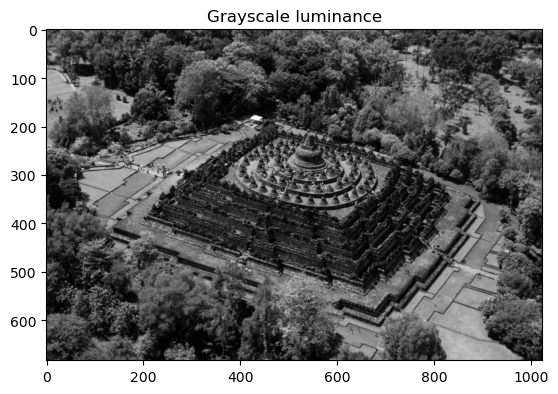

In [13]:
if img is None:
    raise Exception('Image is not found!')

# Create empty arrays for grayscale results
gray_avg = np.zeros(img.shape[:2], dtype=np.uint8)
gray_lightness = np.zeros(img.shape[:2], dtype=np.uint8)
gray_luminance = np.zeros(img.shape[:2], dtype=np.uint8)

# grayscaling by iterating each pixel (too long)
height, width, _ = img.shape
for y in range(height):
    for x in range(width):
        b, g, r = img[y, x]
        gray_avg[y, x] = grayscale_avg(blue=b, green=g, red=r)
        gray_lightness[y, x] = grayscale_lightness(blue=b, green=g, red=r)
        gray_luminance[y, x] = grayscale_luminance(blue=b, green=g, red=r)

plt.title('Grayscale average')
plt.imshow(gray_avg, cmap='gray')
plt.show()

plt.title('Grayscale lightness')
plt.imshow(gray_lightness, cmap='gray')
plt.show()

plt.title('Grayscale luminance')
plt.imshow(gray_luminance, cmap='gray')
plt.show()

Vectorized method

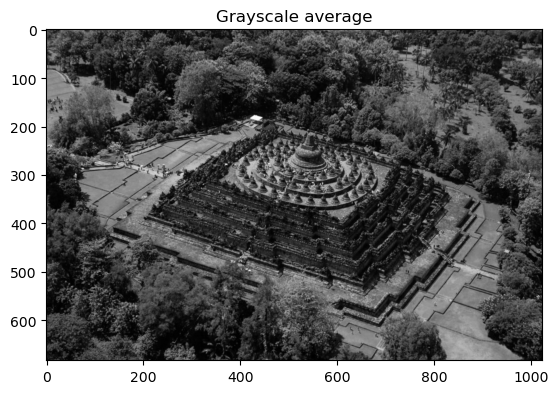

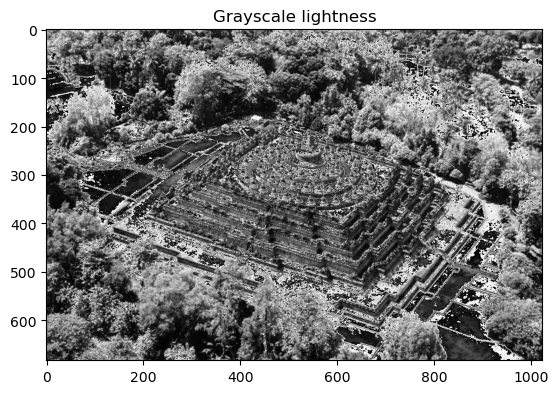

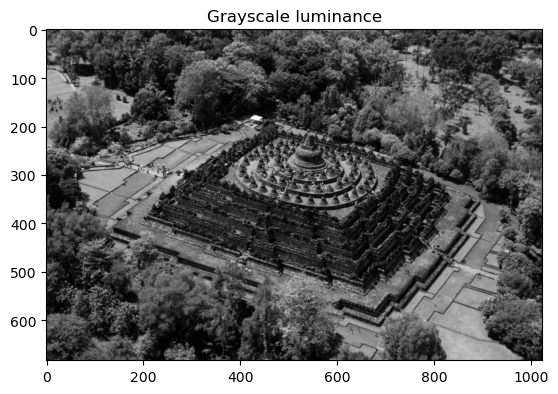

True

In [ ]:
if img is None:
    raise Exception('Image is not found!')


img_gray_avg = vectorized_gray_avg(img)

plt.title('Grayscale average')
plt.imshow(img_gray_avg, cmap='gray')
plt.show()

img_gray_lightness = vectorized_gray_lightness(img)

plt.title('Grayscale lightness')
plt.imshow(img_gray_lightness, cmap='gray')
plt.show()

img_gray_luminance = vectorized_gray_luminance(img)

plt.title('Grayscale luminance')
plt.imshow(img_gray_luminance, cmap='gray')
plt.show()

## 5. Displays a specific color in an image, and converts other colors to grayscale.

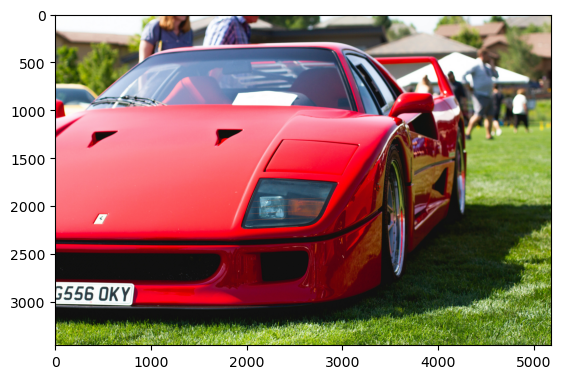

In [15]:
img = cv2.imread('../assets/f40.jpg')

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img_rgb)
plt.show()

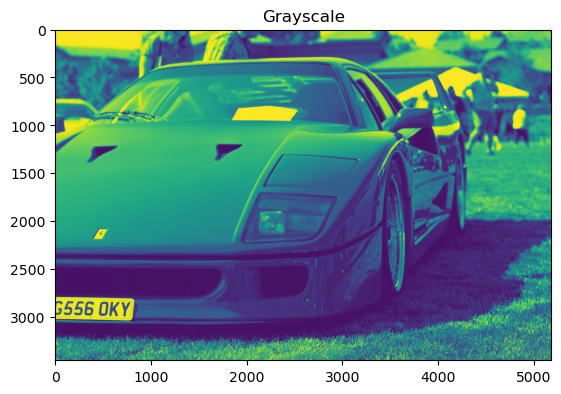

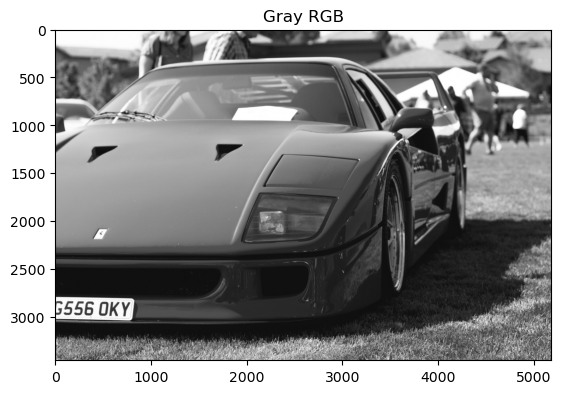

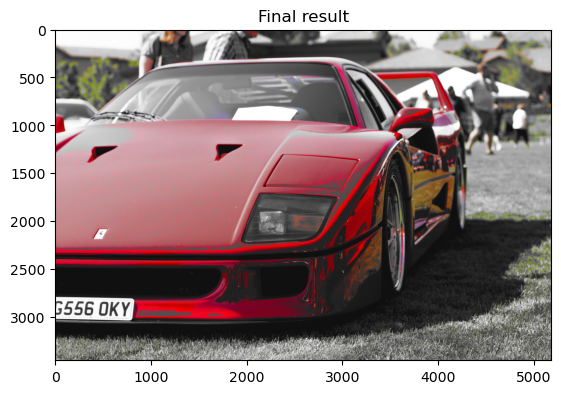

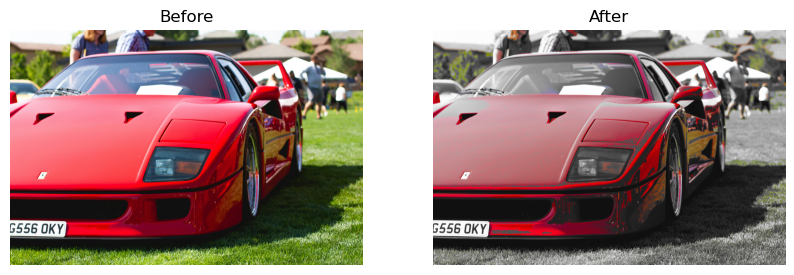

In [16]:
# Lower red and upper red in RGB format
lower_red = np.array([120, 0, 0])       # darker red
upper_red = np.array([252, 159, 177])   # lighter red

# Create mask
mask = cv2.inRange(img_rgb, lower_red, upper_red)

# Convert image to grayscale
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

# Apply mask: keep red where mask>0, otherwise grayscale
result = np.where(mask[..., None] > 0, img_rgb, gray_rgb)

plt.title('Grayscale')
plt.imshow(gray)
plt.show()

plt.title('Gray RGB')
plt.imshow(gray_rgb)
plt.show()

plt.title('Final result')
plt.imshow(result)
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(img_rgb)
axes[0].set_title("Before")
axes[0].axis("off")

axes[1].imshow(result)
axes[1].set_title("After")
axes[1].axis("off")

plt.show()

# 2nd Practicum - Arithmetic and Logical Operations

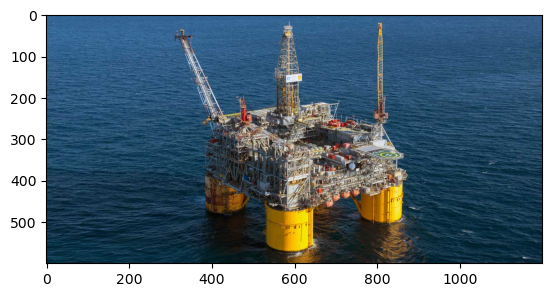

In [3]:
img = cv2.imread('../assets/oil-rig-offshore.jpg')

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

## 1. Implementation of Gamma Correction

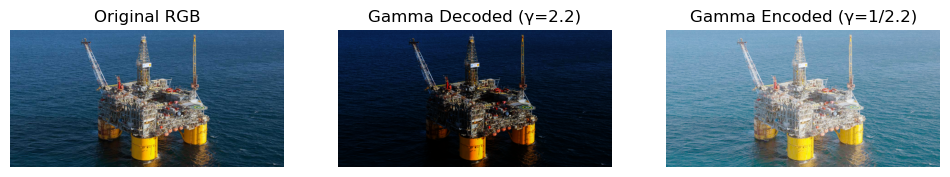

In [21]:
def gamma_correction(img: np.ndarray, gamma: float = 2.2):
    normalized = img / 255.0
    
    # apply gamma correction
    corrected = np.power(normalized, gamma)
    
    # scale back to [0, 255] and convert to uint8
    corrected = np.uint8(corrected * 255)
    
    return corrected

if img is None:
    raise Exception('Image is not found!')

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

gamma_img = gamma_correction(img_rgb, gamma=2.2)

# Apply gamma encoding (1/gamma)
gamma_encoded = gamma_correction(img_rgb, gamma=1/2.2)

# Show results
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.title("Original RGB")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Gamma Decoded (γ=2.2)")
plt.imshow(gamma_img)
plt.axis("off")

plt.subplot(1,3,3)
plt.title("Gamma Encoded (γ=1/2.2)")
plt.imshow(gamma_encoded)
plt.axis("off")

plt.show()

## 2. Simulation image depth

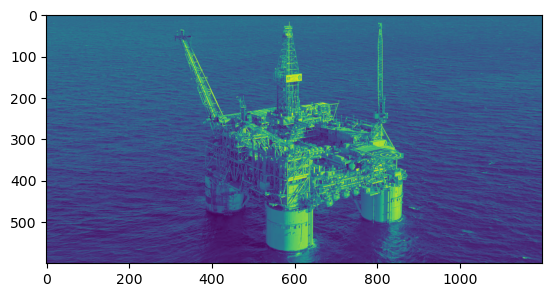

In [5]:
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)

original_img = cv2.imread('../assets/oil-rig-offshore.jpg', cv2.IMREAD_GRAYSCALE)

if original_img is None:
    raise Exception('Image is not found!')

plt.imshow(original_img)
plt.show()

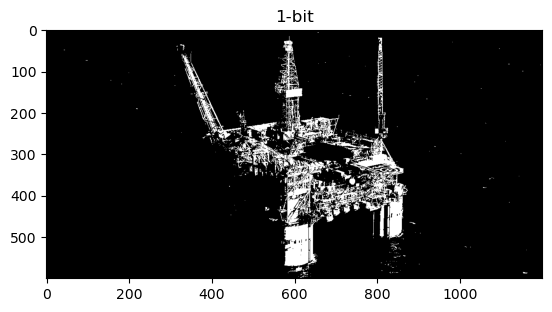

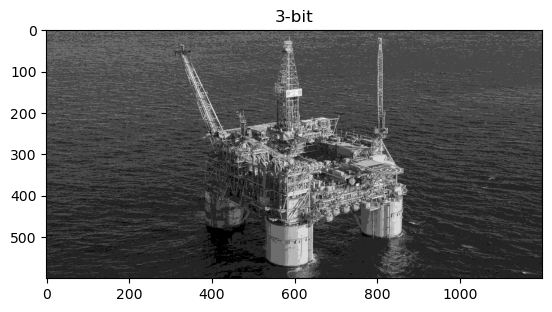

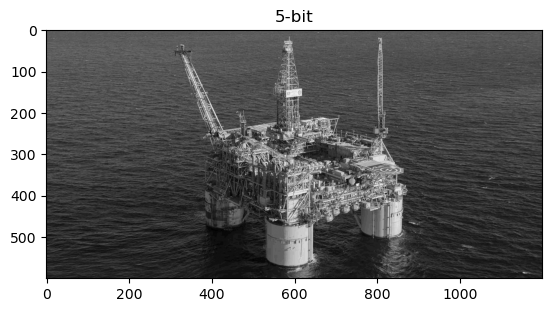

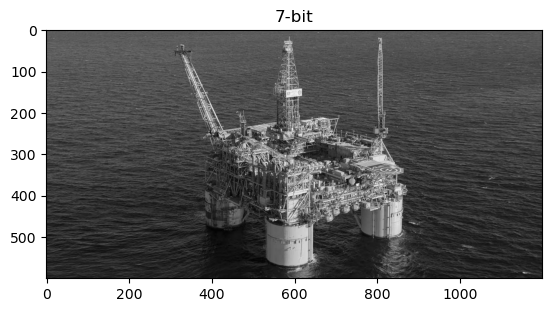

In [7]:
def quantize_bitdepth(img: np.ndarray, bit_depth: int) -> np.ndarray:
    """
    Quantize an image to a lower bit depth with evenly spaced levels.

    Args:
        img (np.ndarray): Input image (uint8).
        bit_depth (int): Target bit depth (1-8).

    Returns:
        np.ndarray: Quantized image (uint8).
    """
    if bit_depth < 1 or bit_depth > 8:
        raise ValueError("bit_depth must be between 1 and 8")
    
    levels = (2 ** bit_depth) 
    step = 255 / (levels - 1)

    # Apply formula: round((C / step)) * step
    quantized = np.round(img / step) * step
    return quantized.astype(np.uint8)

if original_img is None:
    raise Exception('Image is not found!')

for i in range(1, 9, 2):
    img_modified = quantize_bitdepth(original_img, i)

    plt.title(f'{i}-bit')
    plt.imshow(img_modified, cmap='gray')
    plt.show()